# Convolutional AutoEncoder model for anomalies detection

In [1]:
# ---- utils libs ----
import numpy as np
import pandas as pd
import datetime
from typing import Optional

# --- Import functions from module.py ---
import sys
sys.path.insert(0,'..')
from module import plot_confusion_matrix, plot_activity_hist, load_dataset, load_aggregate_dataset, time_in_range, segmentDf, create_sequence, train_test_split_dataset, convertToSequenceParameters

# ---- Data Viz libs ---- 
from matplotlib import pyplot as plt
import plotly.graph_objects as go
import seaborn as sns

# ---- ML libs ----
from sklearn.preprocessing import StandardScaler

# ---- Deep Learning libs ----
from tensorflow import keras
from tensorflow.keras import layers

## Load Dataset

In [2]:
dataset_resampled_1H = load_dataset("house1_power_blk2_labels.zip","60min")
dataset_resampled_1H = dataset_resampled_1H["mains"]
df_mains_resampled_1H = pd.DataFrame(dataset_resampled_1H)
df_mains_resampled_1H

,mains
datetime,
2016-03-06 00:00:00,473.0
2016-03-06 01:00:00,736.0
2016-03-06 02:00:00,479.0
2016-03-06 03:00:00,467.0
2016-03-06 04:00:00,610.0
...,...
2016-05-07 18:00:00,1413.0
2016-05-07 19:00:00,1608.0
2016-05-07 20:00:00,1116.0


In [3]:
dataset_resampled_1H_h2 = load_dataset("house2_power_blk1_labels.zip","60min")
dataset_resampled_1H_h2 = dataset_resampled_1H_h2["mains"]
df_mains_resampled_1H_h2 = pd.DataFrame(dataset_resampled_1H_h2)
df_mains_resampled_1H_h2

,mains
datetime,
2017-09-12 23:00:00,103.0
2017-09-13 00:00:00,112.0
2017-09-13 01:00:00,211.0
2017-09-13 02:00:00,108.0
2017-09-13 03:00:00,207.0
...,...
2017-11-10 19:00:00,218.0
2017-11-10 20:00:00,672.0
2017-11-10 21:00:00,430.0


## Visualize Load Curve

In [4]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_mains_resampled_1H.index, y=df_mains_resampled_1H['mains'], name='Load Curve'))
fig.update_layout(showlegend=True, title='house1_power_blk2_labels_60min')
fig.show()

## Preprocessing

####  1/ Loads the dataset and resample timeseries
####  2/ Split a dataframe into train set and test set according to the split rate
####  3/ Standardize Data
####  4/ Construction of the dataset according to peak and off-peak hours or according to activity labels
####  5/ Creation of sequences of length T and according to the overlapping period

#### Return preprocessed ``3D-array`` ``[samples, SEQUENCE_LENGTH, features]`` (i.e sequences from the timeseries) , as required for **LSTM** network. We want our network to have memory of **10 days**, so we set ``SEQUENCE_LENGTH=10``.

#### Define Global Hyperparmètre

In [5]:
TIME_STEP = datetime.timedelta(minutes=1, seconds=30) # duration of a step in the resample dataset, originally 1 second
DURATION_TIME = datetime.timedelta(minutes=60) # duration of a sequence
OVERLAP_PERIOD_PERCENT = 0.8 # 0.5 <=> 50% overlapping
TIMEFRAMES = [(datetime.time(0,0,0), datetime.time(3,0,0))]
STRATEGY = "off_peak_time" # device, off_peak_time, label 

SEQUENCE_LENGTH, OVERLAP_PERIOD = convertToSequenceParameters(TIME_STEP, DURATION_TIME, OVERLAP_PERIOD_PERCENT)

print("\t\tValeur choisie \t Equivalent sequence\nTimestep : \t {}\nDuration :\t {} \t -->  {} \nOverlap :\t {} \t -->  {}".format(TIME_STEP, DURATION_TIME, SEQUENCE_LENGTH, OVERLAP_PERIOD_PERCENT, OVERLAP_PERIOD))

		Valeur choisie 	 Equivalent sequence
Timestep : 	 0:01:30
Duration :	 1:00:00 	 -->  40 
Overlap :	 0.8 	 -->  32


In [6]:
def preprocessing(timeframes: list
                  ,sequence_length: int, overlap_period: int
                  ,resample_period :Optional[str]=None
                  ,use_labels :Optional[bool]=False
                  ,strategy :Optional[str] = "off_peak_time" 
                  ,split_rate :Optional[float]=0.2
                  ,dataset_name:Optional[str] = "house1_power_blk2_labels.zip") -> np.array:
    """
    1/ Loads the dataset and resample timeseries
    2/ Split a dataframe into train set and test set according to the split rate
    3/ Standardize Data
    4/ Construction of the dataset according to peak and off-peak hours 
    or according to activity labels
    5/ Creation of sequences of length T and according to the overlapping period
    
    Args:
        - resample_period: (optional) the reasmple period, if None the default period of 1 second will be used
        - timeframes: list of tuples indicating the periods of the day ex: timeframes = [(datetime.time(10,0,0), datetime.time(6,0,0)), (datetime.time(12,0,0), datetime.time(13,0,0))
        - use_labels: (False by default) use the activities labels
        - sequence_length: length of the sequence
        - overlap_period: overlap the sequences of timeseries
        - device_approach: the aggregated load curve of the devices which, when in operation, do not allow us to predict an activity 
        - split_rate: Rate of the test set size
        - device_strategy: use inactive devices base load curve
        - dataset_name: the name of the dataset file to use
    Returns: 
        - list of prepocessed 3D-array [samples, sequence_length, features] (i.e sequences from the timeseries) 
    """
        
    # load dataset with labels and resampled timeseries
    df_resampled = load_dataset(dataset_name, resample_period)
    
    # split dataframe into train set and test set
    train_df, test_df = train_test_split_dataset(df_resampled)
    
    # Standardize Data
    scaler = StandardScaler()
    scaler_train = scaler.fit(train_df[['mains']])
    
    train_df['mains'] = scaler_train.transform(train_df[['mains']])
    test_df['mains'] = scaler_train.transform(test_df[['mains']])
        
    # ---- TEST SEQUENCES ----
    X_sequences_test, y_sequences_test = create_sequence(test_df, sequence_length, overlap_period)
    
    if STRATEGY == "device":
        # load dataset with labels and resampled timeseries
        df_resampled_with_labels = load_dataset("house1_power_blk2_labels.zip", resample_period)
        # load dataset with inactive devices
        df_resampled_devices_inactive = load_aggregate_dataset("house1_power_blk2.zip", "inactive_house2", resample_period)
        activity = df_resampled_with_labels["activity"]
        df_resampled_device = df_resampled_devices_inactive.join(activity)
        df_resampled_device['mains'] = scaler_train.transform(df_resampled_device[['mains']])
        
        # --- TRAIN SEQUENCES ----
        X_sequence_train_device, y_sequence_train_device = create_sequence(df_resampled_device, sequence_length, overlap_period)
        
        return df_resampled_device, test_df, X_sequence_train_device, y_sequence_train_device, X_sequences_test, y_sequences_test
    
    
    if STRATEGY == "label":
        # load dataset with labels and resampled timeseries
        df_resampled_with_labels = load_dataset("house1_power_blk2_labels.zip", resample_period)
        df_resampled_with_labels = df_resampled_with_labels[df_resampled_with_labels.activity == 0]
        df_resampled_with_labels['mains'] = scaler_train.transform(df_resampled_with_labels[['mains']])
        
        # --- TRAIN SEQUENCES ----
        X_sequence_train_label, y_sequence_train_label = create_sequence(df_resampled_with_labels, sequence_length, overlap_period)
        
        return df_resampled_with_labels, test_df, X_sequence_train_label, y_sequence_train_label, X_sequences_test, y_sequences_test
    
    
    if STRATEGY == "off_peak_time":
        # --- TRAIN SEQUENCES ----
        # Construction of the dataset according to peak and off-peak hours 
        list_df_train = segmentDf(train_df, timeframes = timeframes)

        # init 3D-array [samples, sequence_length, features]
        first_df_train = list_df_train[0]
        list_X_sequence_train, list_y_sequence_train = create_sequence(first_df_train, sequence_length, overlap_period)
        list_df_train.pop(0) # delete the first element of the list of train dataframes

        # Creation of sequences of length T and according to the overlapping period
        for df_train_ in list_df_train:
            X_sequences_train, y_sequences_train = create_sequence(df_train_, sequence_length, overlap_period)
            list_X_sequence_train = np.append(list_X_sequence_train, X_sequences_train, axis = 0)
            list_y_sequence_train = np.append(list_y_sequence_train, y_sequences_train, axis = 0)
        
        return list_df_train, train_df, test_df, list_X_sequence_train, list_y_sequence_train, X_sequences_test, y_sequences_test

In [7]:
if STRATEGY == "device":
    resampled_device_train_df_h1, test_df_h1, X_train_h1, y_train_h1, X_test_h1, y_test_h1 = preprocessing( 
                              timeframes = TIMEFRAMES
                              ,sequence_length = SEQUENCE_LENGTH
                              ,overlap_period = OVERLAP_PERIOD
                              ,resample_period = TIME_STEP
                              ,strategy = STRATEGY
                              ,dataset_name="house1_power_blk2_labels.zip")

    resampled_device_train_df_h2, test_df_h2, X_train_h2, y_train_h2, X_test_h2, y_test_h2 = preprocessing( 
                              timeframes = TIMEFRAMES
                              ,sequence_length = SEQUENCE_LENGTH
                              ,overlap_period = OVERLAP_PERIOD
                              ,resample_period = TIME_STEP
                              ,strategy = STRATEGY
                              ,dataset_name="house2_power_blk1_labels.zip")
    
if STRATEGY == "label":
    resampled_label_train_df_h1, test_df_h1, X_train_h1, y_train_h1, X_test_h1, y_test_h1 = preprocessing( 
                              timeframes = TIMEFRAMES
                              ,sequence_length = SEQUENCE_LENGTH
                              ,overlap_period = OVERLAP_PERIOD
                              ,resample_period = TIME_STEP
                              ,strategy = STRATEGY
                              ,dataset_name="house1_power_blk2_labels.zip")

    resampled_label_train_df_h2, test_df_h2, X_train_h2, y_train_h2, X_test_h2, y_test_h2 = preprocessing( 
                              timeframes = TIMEFRAMES
                              ,sequence_length = SEQUENCE_LENGTH
                              ,overlap_period = OVERLAP_PERIOD
                              ,resample_period = TIME_STEP
                              ,strategy = STRATEGY
                              ,dataset_name="house2_power_blk1_labels.zip")
    
if STRATEGY == "off_peak_time":
    list_df_train_h1, train_df_h1, test_df_h1, X_train_h1, y_train_h1, X_test_h1, y_test_h1 = preprocessing( 
                              timeframes = TIMEFRAMES
                              ,sequence_length = SEQUENCE_LENGTH
                              ,overlap_period = OVERLAP_PERIOD
                              ,resample_period = TIME_STEP
                              ,strategy = STRATEGY
                              ,dataset_name="house1_power_blk2_labels.zip")
    list_df_train_h2, train_df_h2, test_df_h2, X_train_h2, y_train_h2, X_test_h2, y_test_h2 = preprocessing( 
                              timeframes = TIMEFRAMES
                              ,sequence_length = SEQUENCE_LENGTH
                              ,overlap_period = OVERLAP_PERIOD
                              ,resample_period = TIME_STEP
                              ,strategy = STRATEGY
                              ,dataset_name="house2_power_blk1_labels.zip")

/tmp/ipykernel_134146/3872935662.py:40: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_134146/3872935662.py:41: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/mnt/data/Documents/Cours Télécom/INFMDI780 - Projet Fil Rouge/Activity_Detection_From_Electrical_Consumption_Load_Curves/Convolutional Auto Encoder/../module.py:400: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the 

In [8]:
if STRATEGY == "device":
    print("---- train DataFrame Device shape ----")
    print(resampled_device_train_df_h1.shape)
    print(resampled_device_train_df_h2.shape)
    
if STRATEGY == "label":
    print("---- train DataFrame Label shape ----")
    print(resampled_label_train_df_h1.shape)
    print(resampled_label_train_df_h2.shape)
    
if STRATEGY == "off_peak_time":
    print("---- train DataFrame Off-Peak-Time shape ----")
    print(train_df_h1.shape)
    print(train_df_h2.shape)

---- train DataFrame Off-Peak-Time shape ----
(48352, 3)
(45344, 3)


In [9]:
print("---- test DataFrame shape ----")
print(test_df_h1.shape)
print(test_df_h2.shape)

---- test DataFrame shape ----
(12088, 3)
(11336, 3)


### Visualize ``train_df``

In [10]:
if STRATEGY == "device":
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=resampled_device_train_df_h1.index, y=resampled_device_train_df_h1['mains'], name='Load Curve'))
    fig.update_layout(showlegend=True, title='resampled_device_train_df')
    fig.show()
    
if STRATEGY == "label":
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=resampled_label_train_df_h1.index, y=resampled_label_train_df_h1['mains'], name='Load Curve'))
    fig.update_layout(showlegend=True, title='resampled_label_train_df')
    fig.show()
    
if STRATEGY == "off_peak_time":
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=train_df_h1.index, y=train_df_h1['mains'], name='Load Curve'))
    fig.update_layout(showlegend=True, title='train_df')
    fig.show()

### Visualize ``test_df``

In [11]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=test_df_h1.index, y=test_df_h1['mains'], name='Load Curve'))
fig.update_layout(showlegend=True, title='test_df')
fig.show()

### Visualize ``list_df_train``

In [12]:
if STRATEGY == "off_peak_time":
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=list_df_train_h1[6].index, y=list_df_train_h1[6]['mains'], name='Load Curve'))
    fig.update_layout(showlegend=True, title='list_df_train'+str(2))
    fig.show()

### Verify the shape of the sequence

In [13]:
print("---- X_train sequence shape ----")
print(X_train_h1.shape)
print(X_train_h2.shape)

print("\n---- y_train sequence shape ----")
print(y_train_h1.shape)
print(y_train_h2.shape)

print("\n\n---- X_test sequence shape ----")
print(X_test_h1.shape)
print(X_test_h2.shape)

print("\n---- y_test sequence shape ----")
print(y_test_h1.shape)
print(y_test_h2.shape)

---- X_train sequence shape ----
(561, 40, 1)
(528, 40, 1)

---- y_train sequence shape ----
(561, 40, 3)
(528, 40, 3)


---- X_test sequence shape ----
(1506, 40, 1)
(1412, 40, 1)

---- y_test sequence shape ----
(1506, 40, 3)
(1412, 40, 3)


## Build a model

We will build a convolutional reconstruction autoencoder model. The model will take input of shape (``batch_size``, ``sequence_length``, ``num_features``) and return output of the same shape. In this case, ``sequence_length`` is **10** and ``num_features`` is **1**.

First we'll train a model on house 1.

In [14]:
X_train_h1.shape # 3d Array (samples, SEQUENCE_LENGTH, num_features)

(561, 40, 1)

In [15]:
X_train_h1.shape[1]

40

In [16]:
X_train_h1.shape[2]

1

In [17]:
model_h1 = keras.Sequential(
    [
        layers.Input(shape=(X_train_h1.shape[1], X_train_h1.shape[2])),
        layers.Conv1D(
            filters=32, kernel_size=7, padding="same", strides=2, activation="relu"
        ),
        layers.Dropout(rate=0.2),
        layers.Conv1D(
            filters=16, kernel_size=7, padding="same", strides=2, activation="relu"
        ),
        layers.Conv1DTranspose(
            filters=16, kernel_size=7, padding="same", strides=2, activation="relu"
        ),
        layers.Dropout(rate=0.2),
        layers.Conv1DTranspose(
            filters=32, kernel_size=7, padding="same", strides=2, activation="relu"
        ),
        layers.Conv1DTranspose(filters=1, kernel_size=4, padding="same"),
    ]
)
model_h1.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), loss="mse")
model_h1.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 20, 32)            256       
                                                                 
 dropout (Dropout)           (None, 20, 32)            0         
                                                                 
 conv1d_1 (Conv1D)           (None, 10, 16)            3600      
                                                                 
 conv1d_transpose (Conv1DTra  (None, 20, 16)           1808      
 nspose)                                                         
                                                                 
 dropout_1 (Dropout)         (None, 20, 16)            0         
                                                                 
 conv1d_transpose_1 (Conv1DT  (None, 40, 32)           3616      
 ranspose)                                              

2022-04-28 14:27:48.094432: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-04-28 14:27:48.099953: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-04-28 14:27:48.100126: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-04-28 14:27:48.100599: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags

### Train the model

Please note that we are using ``X_train`` as both the input and the target since this is a reconstruction model.

In [18]:
history = model_h1.fit(
    X_train_h1,
    X_train_h1,
    epochs=50,
    batch_size=128,
    validation_split=0.1,
    callbacks=[
        keras.callbacks.EarlyStopping(monitor="val_loss", patience=5, mode="min")
    ],
)

Epoch 1/50


2022-04-28 14:27:49.776839: I tensorflow/stream_executor/cuda/cuda_dnn.cc:368] Loaded cuDNN version 8101


4/4 [==============================] - 3s 230ms/step - loss: 0.3834 - val_loss: 0.3354
Epoch 2/50
4/4 [==============================] - 0s 23ms/step - loss: 0.3512 - val_loss: 0.2991
Epoch 3/50
4/4 [==============================] - 0s 34ms/step - loss: 0.3063 - val_loss: 0.2415
Epoch 4/50
4/4 [==============================] - 0s 26ms/step - loss: 0.2378 - val_loss: 0.1558
Epoch 5/50
4/4 [==============================] - 0s 23ms/step - loss: 0.1431 - val_loss: 0.0556
Epoch 6/50
4/4 [==============================] - 0s 27ms/step - loss: 0.0637 - val_loss: 0.0389
Epoch 7/50
4/4 [==============================] - 0s 31ms/step - loss: 0.0801 - val_loss: 0.0365
Epoch 8/50
4/4 [==============================] - 0s 28ms/step - loss: 0.0533 - val_loss: 0.0228
Epoch 9/50
4/4 [==============================] - 0s 22ms/step - loss: 0.0430 - val_loss: 0.0304
Epoch 10/50
4/4 [==============================] - 0s 32ms/step - loss: 0.0446 - val_loss: 0.0280
Epoch 11/50
4/4 [======================

### Evaluation of the model

Let's plot training and validation loss to see how the training went.

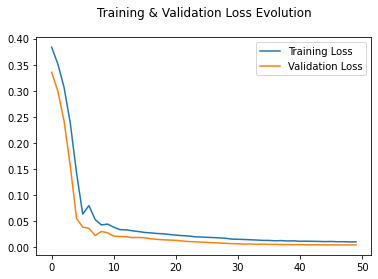

In [19]:
plt.plot(history.history["loss"], label="Training Loss")
plt.plot(history.history["val_loss"], label="Validation Loss")
plt.legend()
plt.title("Training & Validation Loss Evolution\n")
plt.show()

### Detecting anomalies

We will detect anomalies by determining how well our model can reconstruct the input data.

**1/** Find ``MAE`` loss on training samples.

**2/** Find max MAE loss value. This is the worst our model has performed trying to reconstruct a sample. We will make this the ``threshold`` for anomaly detection.

**3/** If the reconstruction loss for a sample is greater than this ``threshold`` value then we can infer that the model is seeing a pattern that it isn't familiar with. We will label this sample as an **anomaly.**

/home/pierre/.local/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



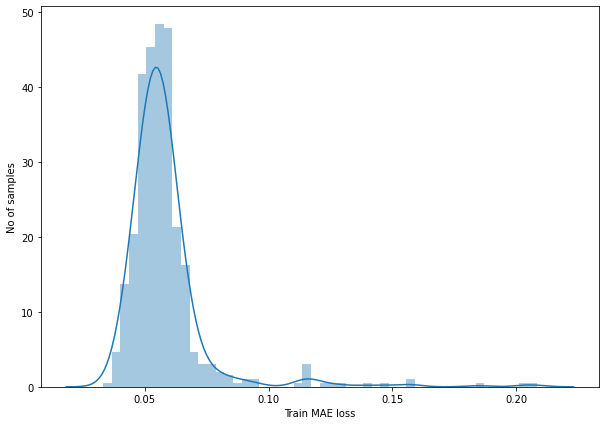

Reconstruction error threshold:  0.20827036809981347


In [20]:
# Get train MAE loss.
X_train_pred_h1 = model_h1.predict(X_train_h1)
train_mae_loss_h1 = np.mean(np.abs(X_train_pred_h1 - X_train_h1), axis=1)

plt.figure(figsize = (10, 7))
sns.distplot(train_mae_loss_h1, bins=50, kde = True)
plt.xlabel("Train MAE loss")
plt.ylabel("No of samples")
plt.show()

# Get reconstruction loss threshold.
threshold_h1 = np.max(train_mae_loss_h1)
print("Reconstruction error threshold: ", threshold_h1)

### Compare recontruction

Just for fun, let's see how our model has recontructed the first sample. This is the **40** timesteps from day 1 of our training dataset.

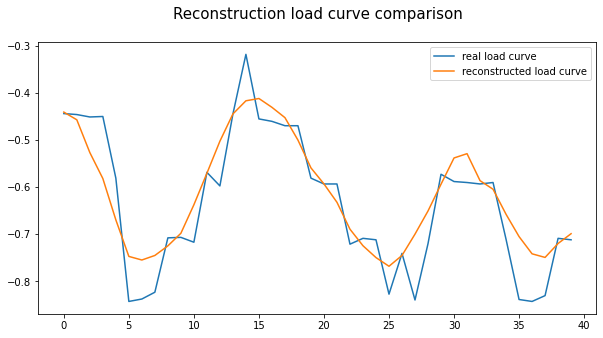

In [21]:
# Checking how the first sequence is learnt
plt.figure(figsize = (10, 5))
plt.plot(X_train_h1[5], label="real load curve")
plt.plot(X_train_pred_h1[5], label="reconstructed load curve")
plt.title("Reconstruction load curve comparison\n", fontsize=15)
plt.legend()
plt.show()

### Prepare test data for house 1

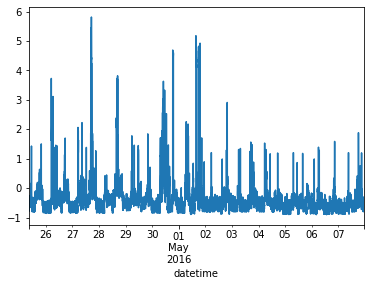

In [22]:
df_test_value_h1 = test_df_h1["mains"]
fig, ax = plt.subplots()
df_test_value_h1.plot(legend=False, ax=ax)
plt.show()

/home/pierre/.local/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



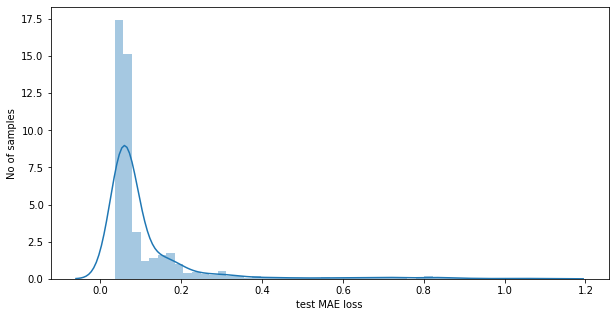

Number of anomaly samples: 
137


Indices of anomaly samples: 
(array([  96,   97,   98,   99,  100,  101,  102,  103,  104,  105,  106,
        107,  108,  159,  160,  161,  162,  218,  219,  220,  221,  234,
        235,  237,  239,  276,  277,  278,  279,  280,  281,  282,  283,
        284,  285,  286,  389,  391,  392,  393,  394,  395,  396,  397,
        398,  399,  400,  401,  490,  491,  492,  493,  535,  593,  596,
        597,  598,  599,  600,  601,  602,  603,  604,  605,  606,  607,
        608,  609,  610,  611,  612,  613,  616,  617,  618,  619,  644,
        645,  646,  647,  648,  649,  650,  651,  706,  707,  708,  709,
        710,  711,  712,  713,  714,  715,  716,  717,  718,  749,  750,
        751,  752,  753,  754,  755,  756,  760,  761,  762,  763,  764,
        765,  766,  767,  768,  769,  770,  771,  772,  890,  891,  892,
        893,  894,  995,  996,  997,  998,  999, 1003, 1004, 1005, 1006,
       1069, 1306, 1483, 1485, 1486]),)


In [23]:
# Get test MAE loss.
X_test_pred_h1 = model_h1.predict(X_test_h1)
test_mae_loss_h1 = np.mean(np.abs(X_test_pred_h1 - X_test_h1), axis=1)
test_mae_loss_h1 = test_mae_loss_h1.reshape((-1))

plt.figure(figsize = (10, 5))
sns.distplot(test_mae_loss_h1, bins=50)
plt.xlabel("test MAE loss")
plt.ylabel("No of samples")
plt.show()

# Detect all the samples which are anomalies.
anomalies = test_mae_loss_h1 > threshold_h1
print("Number of anomaly samples: ")
print(np.sum(anomalies))

print("\n\nIndices of anomaly samples: ")
print(np.where(anomalies))

### Plot anomalies

In [24]:
# get index of each sequence considered as an anomaly
sequences_anomalies_idx = list()
for i in range(len(anomalies)):
    if anomalies[i] == True:
        sequences_anomalies_idx.append(i)

# get index of each data point from X_test considered as an anomaly 
data_anomalies_idx = list()
for elm in sequences_anomalies_idx:
    for i in range(SEQUENCE_LENGTH):
        data_idx = y_test_h1[elm][i][2] 
        data_anomalies_idx.append(data_idx)

print("Number of data points considered as anomalies (= activity) : ", len(data_anomalies_idx))

Number of data points considered as anomalies (= activity) :  5480


### Plot all the sequences > ``threshold`` as an anomalie  

In [25]:
df_subset_h1 = df_test_value_h1.iloc[data_anomalies_idx]
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_test_value_h1.index, y=df_test_value_h1.values, name='Normal'))
fig.add_trace(go.Scatter(x=df_subset_h1.index, y=df_subset_h1.values, mode='markers', name='Anomaly = Activity'))
fig.update_layout(showlegend=True, title='Detected anomalies')
fig.show()

### Plot data point > ``threshold`` of each sequences considered as an anomaly 

In [26]:
df_subset_h1 = df_test_value_h1.iloc[data_anomalies_idx]
df_subset_h1 = df_subset_h1[df_subset_h1.values > threshold_h1]
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_test_value_h1.index, y=df_test_value_h1.values, name='Normal'))
fig.add_trace(go.Scatter(x=df_subset_h1.index, y=df_subset_h1.values, mode='markers', name='Anomaly = Activity'))
fig.update_layout(showlegend=True, title='Detected anomalies')
fig.show()

### Verification avec les labels

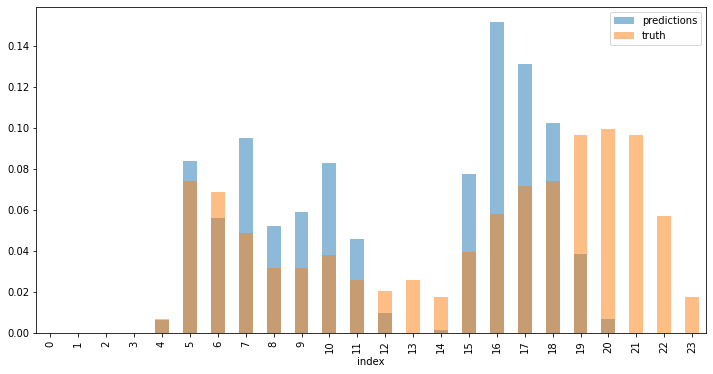

In [27]:
df_subset_pred_h1 = pd.DataFrame(df_subset_h1)
df_subset_pred_h1["activity_pred"] = 1

fig, ax = plt.subplots() 

plot_activity_hist(df_subset_pred_h1['activity_pred'], figsize=(12, 6), alpha=0.5, label='predictions', ax=ax) 
plot_activity_hist(test_df_h1["activity"], figsize=(12, 6), alpha=0.5, label='truth', color='tab:orange', ax=ax)

Score f_beta : 48.971%
Score accuracy : 60.250%


(0.48970880948606055, 0.6024983454665784)

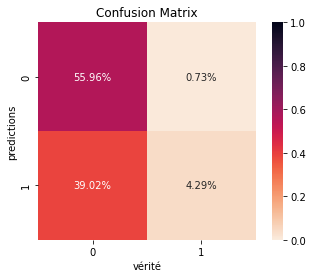

In [28]:
test_df_eval_h1 = test_df_h1.copy()
test_df_eval_h1["activity"] = 0
idx_anom = df_subset_pred_h1.index
test_df_eval_h1.loc[idx_anom, "activity"] = 1
test_df_eval_h1
plot_confusion_matrix(test_df_h1["activity"].values, test_df_eval_h1['activity'].values)

### Detect anomalies on house 2

/home/pierre/.local/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



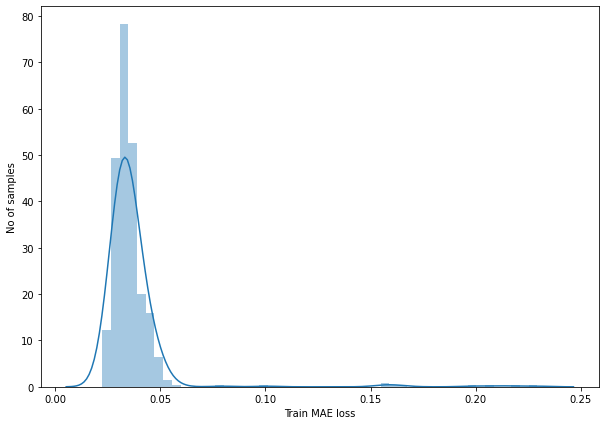

Reconstruction error threshold:  0.22939123212937623


In [29]:
# Get train MAE loss.
X_train_pred_h2 = model_h1.predict(X_train_h2)
train_mae_loss_h2 = np.mean(np.abs(X_train_pred_h2 - X_train_h2), axis=1)

plt.figure(figsize = (10, 7))
sns.distplot(train_mae_loss_h2, bins=50, kde = True)
plt.xlabel("Train MAE loss")
plt.ylabel("No of samples")
plt.show()

# Get reconstruction loss threshold.
threshold_h2 = np.max(train_mae_loss_h2)
print("Reconstruction error threshold: ", threshold_h2)

### Prepare test data for house 2

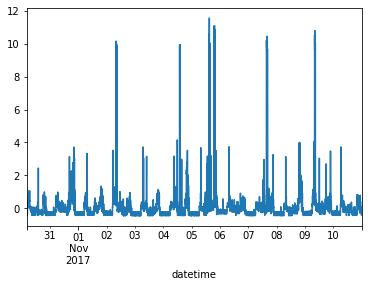

In [30]:
df_test_value_h2 = test_df_h2["mains"]
fig, ax = plt.subplots()
df_test_value_h2.plot(legend=False, ax=ax)
plt.show()

/home/pierre/.local/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



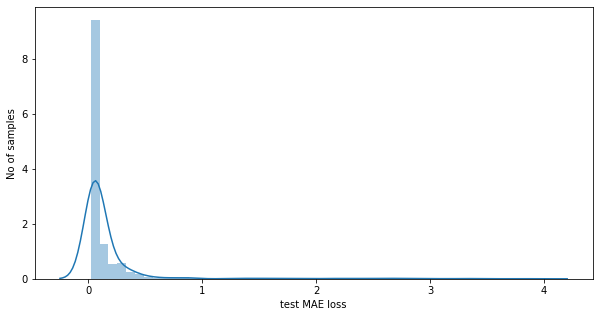

In [31]:
# Get test MAE loss.
X_test_pred_h2 = model_h1.predict(X_test_h2)
test_mae_loss_h2 = np.mean(np.abs(X_test_pred_h2 - X_test_h2), axis=1)
test_mae_loss_h2 = test_mae_loss_h2.reshape((-1))

plt.figure(figsize = (10, 5))
sns.distplot(test_mae_loss_h2, bins=50)
plt.xlabel("test MAE loss")
plt.ylabel("No of samples")
plt.show()

anomalies = test_mae_loss_h2 > threshold_h2

### Plot anomalies

In [32]:
# get index of each sequence considered as an anomaly
sequences_anomalies_idx = list()
for i in range(len(anomalies)):
    if anomalies[i] == True:
        sequences_anomalies_idx.append(i)

# get index of each data point from X_test considered as an anomaly 
data_anomalies_idx = list()
for elm in sequences_anomalies_idx:
    for i in range(SEQUENCE_LENGTH):
        data_idx = y_test_h2[elm][i][2] 
        data_anomalies_idx.append(data_idx)

print("Number of data points considered as anomalies (= activity) : ", len(data_anomalies_idx))

Number of data points considered as anomalies (= activity) :  7560


### Plot all the sequences > ``threshold`` as an anomalie  

In [33]:
df_subset_h2 = df_test_value_h2.iloc[data_anomalies_idx]
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_test_value_h2.index, y=df_test_value_h2.values, name='Normal'))
fig.add_trace(go.Scatter(x=df_subset_h2.index, y=df_subset_h2.values, mode='markers', name='Anomaly = Activity'))
fig.update_layout(showlegend=True, title='Detected anomalies')
fig.show()

### Plot data point > ``threshold`` of each sequences considered as an anomaly 

In [34]:
df_subset_h2 = df_test_value_h2.iloc[data_anomalies_idx]
df_subset_h2 = df_subset_h2[df_subset_h2.values > threshold_h2]
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_test_value_h2.index, y=df_test_value_h2.values, name='Normal'))
fig.add_trace(go.Scatter(x=df_subset_h2.index, y=df_subset_h2.values, mode='markers', name='Anomaly = Activity'))
fig.update_layout(showlegend=True, title='Detected anomalies')
fig.show()

### Verification avec les labels

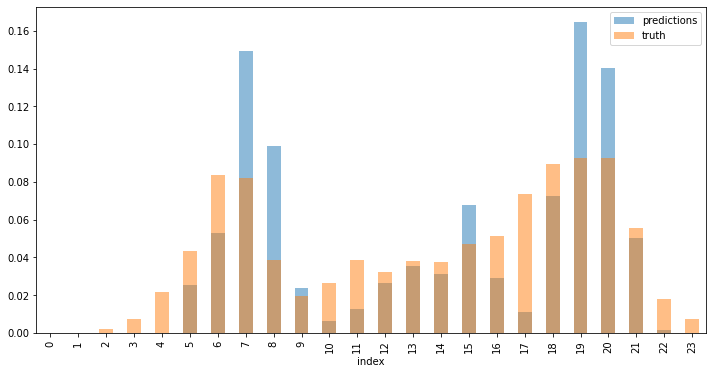

In [35]:
df_subset_pred_h2 = pd.DataFrame(df_subset_h2)
df_subset_pred_h2["activity_pred"] = 1

fig, ax = plt.subplots() 

plot_activity_hist(df_subset_pred_h2['activity_pred'], figsize=(12, 6), alpha=0.5, label='predictions', ax=ax) 
plot_activity_hist(test_df_h2["activity"], figsize=(12, 6), alpha=0.5, label='truth', color='tab:orange', ax=ax)

Score f_beta : 64.229%
Score accuracy : 66.981%


(0.6422878924301572, 0.6698129851799577)

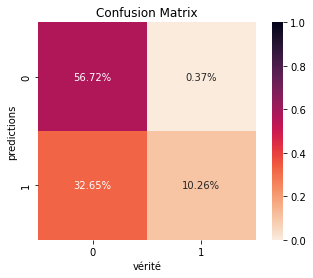

In [36]:
test_df_eval_h2 = test_df_h2.copy()
test_df_eval_h2["activity"] = 0
idx_anom = df_subset_pred_h2.index
test_df_eval_h2.loc[idx_anom, "activity"] = 1
test_df_eval_h2
plot_confusion_matrix(test_df_h2["activity"].values, test_df_eval_h2['activity'].values)

### Fune-tine the model on house 2

Epoch 1/25
4/4 [==============================] - 0s 145ms/step - loss: 0.0065 - val_loss: 0.0018
Epoch 2/25
4/4 [==============================] - 0s 27ms/step - loss: 0.0057 - val_loss: 0.0023
Epoch 3/25
4/4 [==============================] - 0s 25ms/step - loss: 0.0056 - val_loss: 0.0024
Epoch 4/25
4/4 [==============================] - 0s 22ms/step - loss: 0.0057 - val_loss: 0.0022
Epoch 5/25
4/4 [==============================] - 0s 23ms/step - loss: 0.0053 - val_loss: 0.0019
Epoch 6/25
4/4 [==============================] - 0s 25ms/step - loss: 0.0050 - val_loss: 0.0016
Epoch 7/25
4/4 [==============================] - 0s 26ms/step - loss: 0.0050 - val_loss: 0.0015
Epoch 8/25
4/4 [==============================] - 0s 28ms/step - loss: 0.0049 - val_loss: 0.0015
Epoch 9/25
4/4 [==============================] - 0s 22ms/step - loss: 0.0048 - val_loss: 0.0015
Epoch 10/25
4/4 [==============================] - 0s 25ms/step - loss: 0.0047 - val_loss: 0.0016
Epoch 11/25
4/4 [===========

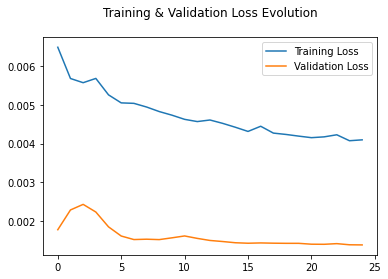

In [37]:
history = model_h1.fit(
    X_train_h2,
    X_train_h2,
    epochs=25,
    batch_size=128,
    validation_split=0.1,
    callbacks=[
        keras.callbacks.EarlyStopping(monitor="val_loss", patience=5, mode="min")
    ],
)

plt.plot(history.history["loss"], label="Training Loss")
plt.plot(history.history["val_loss"], label="Validation Loss")
plt.legend()
plt.title("Training & Validation Loss Evolution\n")
plt.show()

Number of data points considered as anomalies (= activity) :  3840


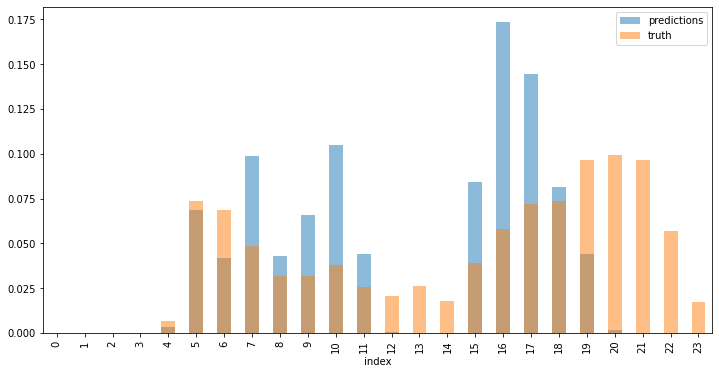

In [38]:
# Get train MAE loss.
X_train_pred_h1 = model_h1.predict(X_train_h1)
train_mae_loss_h1 = np.mean(np.abs(X_train_pred_h1 - X_train_h1), axis=1)

# Get reconstruction loss threshold.
threshold_h1 = np.max(train_mae_loss_h1)

df_test_value_h1 = test_df_h1["mains"]

anomalies = test_mae_loss_h1 > threshold_h1

# get index of each sequence considered as an anomaly
sequences_anomalies_idx = list()
for i in range(len(anomalies)):
    if anomalies[i] == True:
        sequences_anomalies_idx.append(i)

# get index of each data point from X_test considered as an anomaly 
data_anomalies_idx = list()
for elm in sequences_anomalies_idx:
    for i in range(SEQUENCE_LENGTH):
        data_idx = y_test_h1[elm][i][2] 
        data_anomalies_idx.append(data_idx)

print("Number of data points considered as anomalies (= activity) : ", len(data_anomalies_idx))

df_subset_h1 = df_test_value_h1.iloc[data_anomalies_idx]
df_subset_h1 = df_subset_h1[df_subset_h1.values > threshold_h1]
df_subset_pred_h1 = pd.DataFrame(df_subset_h1)
df_subset_pred_h1["activity_pred"] = 1

fig, ax = plt.subplots() 

plot_activity_hist(df_subset_pred_h1['activity_pred'], figsize=(12, 6), alpha=0.5, label='predictions', ax=ax) 
plot_activity_hist(test_df_h1["activity"], figsize=(12, 6), alpha=0.5, label='truth', color='tab:orange', ax=ax)

Score f_beta : 45.492%
Score accuracy : 59.332%


(0.4549163327101916, 0.5933156849768365)

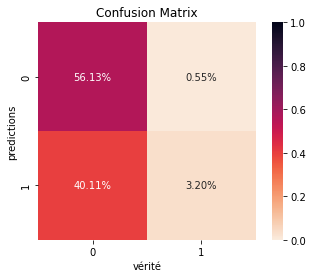

In [39]:
test_df_eval_h1 = test_df_h1.copy()
test_df_eval_h1["activity"] = 0
idx_anom = df_subset_pred_h1.index
test_df_eval_h1.loc[idx_anom, "activity"] = 1
test_df_eval_h1
plot_confusion_matrix(test_df_h1["activity"].values, test_df_eval_h1['activity'].values)

Number of data points considered as anomalies (= activity) :  9560


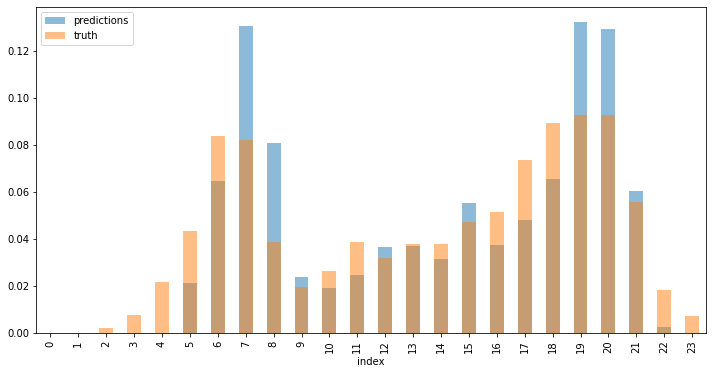

In [40]:
# Get train MAE loss.
X_train_pred_h2 = model_h1.predict(X_train_h2)
train_mae_loss_h2 = np.mean(np.abs(X_train_pred_h2 - X_train_h2), axis=1)

# Get reconstruction loss threshold.
threshold_h2 = np.max(train_mae_loss_h2)

df_test_value_h2 = test_df_h2["mains"]

anomalies = test_mae_loss_h2 > threshold_h2

# get index of each sequence considered as an anomaly
sequences_anomalies_idx = list()
for i in range(len(anomalies)):
    if anomalies[i] == True:
        sequences_anomalies_idx.append(i)

# get index of each data point from X_test considered as an anomaly 
data_anomalies_idx = list()
for elm in sequences_anomalies_idx:
    for i in range(SEQUENCE_LENGTH):
        data_idx = y_test_h2[elm][i][2] 
        data_anomalies_idx.append(data_idx)

print("Number of data points considered as anomalies (= activity) : ", len(data_anomalies_idx))

df_subset_h2 = df_test_value_h2.iloc[data_anomalies_idx]
df_subset_h2 = df_subset_h2[df_subset_h2.values > threshold_h2]
df_subset_pred_h2 = pd.DataFrame(df_subset_h2)
df_subset_pred_h2["activity_pred"] = 1

fig, ax = plt.subplots() 

plot_activity_hist(df_subset_pred_h2['activity_pred'], figsize=(12, 6), alpha=0.5, label='predictions', ax=ax) 
plot_activity_hist(test_df_h2["activity"], figsize=(12, 6), alpha=0.5, label='truth', color='tab:orange', ax=ax)

Score f_beta : 68.438%
Score accuracy : 69.469%


(0.6843816287405893, 0.6946894848270995)

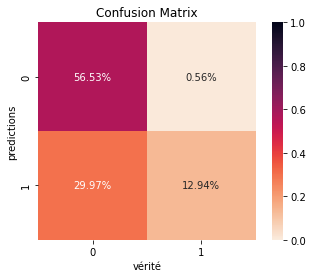

In [41]:
test_df_eval_h2 = test_df_h2.copy()
test_df_eval_h2["activity"] = 0
idx_anom = df_subset_pred_h2.index
test_df_eval_h2.loc[idx_anom, "activity"] = 1
test_df_eval_h2
plot_confusion_matrix(test_df_h2["activity"].values, test_df_eval_h2['activity'].values)

## Fit a model on house 2

In [42]:
model_h2 = keras.Sequential(
    [
        layers.Input(shape=(X_train_h2.shape[1], X_train_h2.shape[2])),
        layers.Conv1D(
            filters=32, kernel_size=7, padding="same", strides=2, activation="relu"
        ),
        layers.Dropout(rate=0.2),
        layers.Conv1D(
            filters=16, kernel_size=7, padding="same", strides=2, activation="relu"
        ),
        layers.Conv1DTranspose(
            filters=16, kernel_size=7, padding="same", strides=2, activation="relu"
        ),
        layers.Dropout(rate=0.2),
        layers.Conv1DTranspose(
            filters=32, kernel_size=7, padding="same", strides=2, activation="relu"
        ),
        layers.Conv1DTranspose(filters=1, kernel_size=4, padding="same"),
    ]
)
model_h2.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), loss="mse")
model_h2.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_2 (Conv1D)           (None, 20, 32)            256       
                                                                 
 dropout_2 (Dropout)         (None, 20, 32)            0         
                                                                 
 conv1d_3 (Conv1D)           (None, 10, 16)            3600      
                                                                 
 conv1d_transpose_3 (Conv1DT  (None, 20, 16)           1808      
 ranspose)                                                       
                                                                 
 dropout_3 (Dropout)         (None, 20, 16)            0         
                                                                 
 conv1d_transpose_4 (Conv1DT  (None, 40, 32)           3616      
 ranspose)                                            

### Train the model

Please note that we are using ``X_train`` as both the input and the target since this is a reconstruction model.

In [43]:
history = model_h2.fit(
    X_train_h2,
    X_train_h2,
    epochs=50,
    batch_size=128,
    validation_split=0.1,
    callbacks=[
        keras.callbacks.EarlyStopping(monitor="val_loss", patience=5, mode="min")
    ],
)

Epoch 1/50
4/4 [==============================] - 1s 55ms/step - loss: 0.1203 - val_loss: 0.0957
Epoch 2/50
4/4 [==============================] - 0s 10ms/step - loss: 0.1039 - val_loss: 0.0793
Epoch 3/50
4/4 [==============================] - 0s 11ms/step - loss: 0.0832 - val_loss: 0.0551
Epoch 4/50
4/4 [==============================] - 0s 12ms/step - loss: 0.0544 - val_loss: 0.0257
Epoch 5/50
4/4 [==============================] - 0s 10ms/step - loss: 0.0247 - val_loss: 0.0138
Epoch 6/50
4/4 [==============================] - 0s 11ms/step - loss: 0.0227 - val_loss: 0.0191
Epoch 7/50
4/4 [==============================] - 0s 11ms/step - loss: 0.0205 - val_loss: 0.0106
Epoch 8/50
4/4 [==============================] - 0s 12ms/step - loss: 0.0153 - val_loss: 0.0109
Epoch 9/50
4/4 [==============================] - 0s 11ms/step - loss: 0.0164 - val_loss: 0.0114
Epoch 10/50
4/4 [==============================] - 0s 11ms/step - loss: 0.0162 - val_loss: 0.0099
Epoch 11/50
4/4 [============

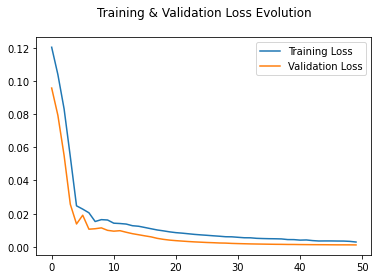

In [44]:
plt.plot(history.history["loss"], label="Training Loss")
plt.plot(history.history["val_loss"], label="Validation Loss")
plt.legend()
plt.title("Training & Validation Loss Evolution\n")
plt.show()

### Detecting anomalies

We will detect anomalies by determining how well our model can reconstruct the input data.

**1/** Find ``MAE`` loss on training samples.

**2/** Find max MAE loss value. This is the worst our model has performed trying to reconstruct a sample. We will make this the ``threshold`` for anomaly detection.

**3/** If the reconstruction loss for a sample is greater than this ``threshold`` value then we can infer that the model is seeing a pattern that it isn't familiar with. We will label this sample as an **anomaly.**

/home/pierre/.local/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



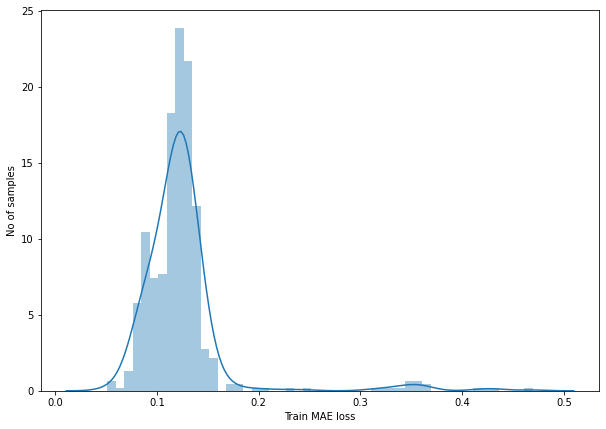

Reconstruction error threshold:  0.4694611561563047


In [45]:
# Get train MAE loss.
X_train_pred_h1 = model_h2.predict(X_train_h1)
train_mae_loss_h1 = np.mean(np.abs(X_train_pred_h1 - X_train_h1), axis=1)

plt.figure(figsize = (10, 7))
sns.distplot(train_mae_loss_h1, bins=50, kde = True)
plt.xlabel("Train MAE loss")
plt.ylabel("No of samples")
plt.show()

# Get reconstruction loss threshold.
threshold_h1 = np.max(train_mae_loss_h1)
print("Reconstruction error threshold: ", threshold_h1)

### Compare recontruction

Just for fun, let's see how our model has recontructed the first sample. This is the **40** timesteps from day 1 of our training dataset.

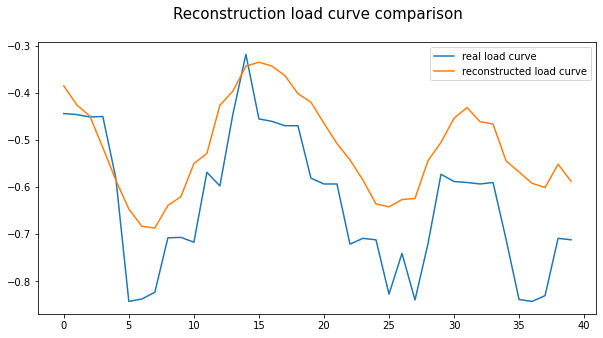

In [46]:
# Checking how the first sequence is learnt
plt.figure(figsize = (10, 5))
plt.plot(X_train_h1[5], label="real load curve")
plt.plot(X_train_pred_h1[5], label="reconstructed load curve")
plt.title("Reconstruction load curve comparison\n", fontsize=15)
plt.legend()
plt.show()

/home/pierre/.local/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



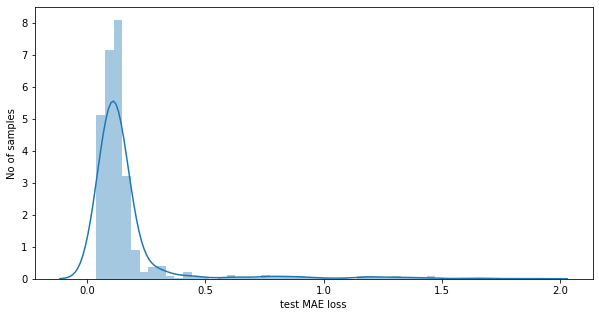

In [47]:
# Get test MAE loss.
X_test_pred_h1 = model_h2.predict(X_test_h1)
test_mae_loss_h1 = np.mean(np.abs(X_test_pred_h1 - X_test_h1), axis=1)
test_mae_loss_h1 = test_mae_loss_h1.reshape((-1))

plt.figure(figsize = (10, 5))
sns.distplot(test_mae_loss_h1, bins=50)
plt.xlabel("test MAE loss")
plt.ylabel("No of samples")
plt.show()

anomalies = test_mae_loss_h1 > threshold_h1

### Plot anomalies

In [48]:
# get index of each sequence considered as an anomaly
sequences_anomalies_idx = list()
for i in range(len(anomalies)):
    if anomalies[i] == True:
        sequences_anomalies_idx.append(i)

# get index of each data point from X_test considered as an anomaly 
data_anomalies_idx = list()
for elm in sequences_anomalies_idx:
    for i in range(SEQUENCE_LENGTH):
        data_idx = y_test_h1[elm][i][2] 
        data_anomalies_idx.append(data_idx)

print("Number of data points considered as anomalies (= activity) : ", len(data_anomalies_idx))

Number of data points considered as anomalies (= activity) :  3080


### Plot all the sequences > ``threshold`` as an anomalie  

In [49]:
df_subset_h1 = df_test_value_h1.iloc[data_anomalies_idx]
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_test_value_h1.index, y=df_test_value_h1.values, name='Normal'))
fig.add_trace(go.Scatter(x=df_subset_h1.index, y=df_subset_h1.values, mode='markers', name='Anomaly = Activity'))
fig.update_layout(showlegend=True, title='Detected anomalies')
fig.show()

### Plot data point > ``threshold`` of each sequences considered as an anomaly 

In [50]:
df_subset_h1 = df_test_value_h1.iloc[data_anomalies_idx]
df_subset_h1 = df_subset_h1[df_subset_h1.values > threshold_h1]
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_test_value_h1.index, y=df_test_value_h1.values, name='Normal'))
fig.add_trace(go.Scatter(x=df_subset_h1.index, y=df_subset_h1.values, mode='markers', name='Anomaly = Activity'))
fig.update_layout(showlegend=True, title='Detected anomalies')
fig.show()

### Verification avec les labels

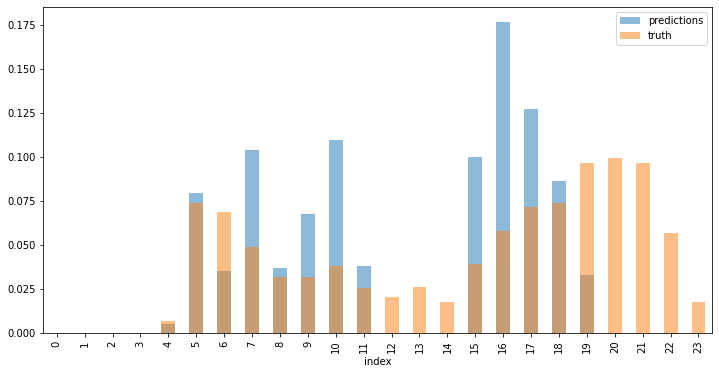

In [51]:
df_subset_pred_h1 = pd.DataFrame(df_subset_h1)
df_subset_pred_h1["activity_pred"] = 1

fig, ax = plt.subplots() 

plot_activity_hist(df_subset_pred_h1['activity_pred'], figsize=(12, 6), alpha=0.5, label='predictions', ax=ax) 
plot_activity_hist(test_df_h1["activity"], figsize=(12, 6), alpha=0.5, label='truth', color='tab:orange', ax=ax)

Score f_beta : 44.009%
Score accuracy : 58.951%


(0.4400939160432648, 0.5895102581072138)

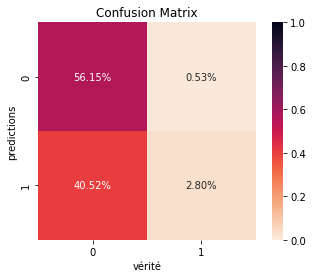

In [52]:
test_df_eval_h1 = test_df_h1.copy()
test_df_eval_h1["activity"] = 0
idx_anom = df_subset_pred_h1.index
test_df_eval_h1.loc[idx_anom, "activity"] = 1
test_df_eval_h1
plot_confusion_matrix(test_df_h1["activity"].values, test_df_eval_h1['activity'].values)

### Detect anomalies on house 2

/home/pierre/.local/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



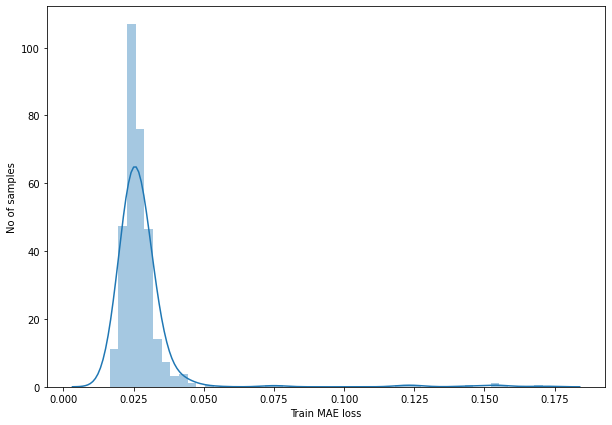

Reconstruction error threshold:  0.17068391150636802


In [53]:
# Get train MAE loss.
X_train_pred_h2 = model_h1.predict(X_train_h2)
train_mae_loss_h2 = np.mean(np.abs(X_train_pred_h2 - X_train_h2), axis=1)

plt.figure(figsize = (10, 7))
sns.distplot(train_mae_loss_h2, bins=50, kde = True)
plt.xlabel("Train MAE loss")
plt.ylabel("No of samples")
plt.show()

# Get reconstruction loss threshold.
threshold_h2 = np.max(train_mae_loss_h2)
print("Reconstruction error threshold: ", threshold_h2)

### Prepare test data for house 2

/home/pierre/.local/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



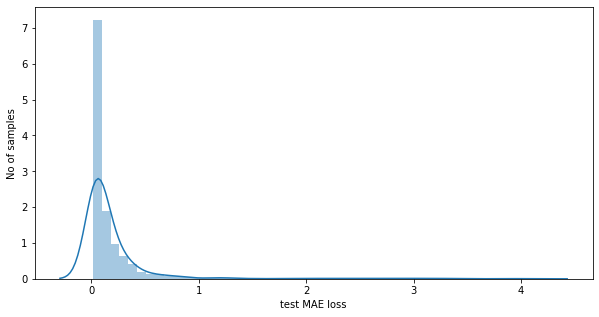

In [54]:
# Get test MAE loss.
X_test_pred_h2 = model_h2.predict(X_test_h2)
test_mae_loss_h2 = np.mean(np.abs(X_test_pred_h2 - X_test_h2), axis=1)
test_mae_loss_h2 = test_mae_loss_h2.reshape((-1))

plt.figure(figsize = (10, 5))
sns.distplot(test_mae_loss_h2, bins=50)
plt.xlabel("test MAE loss")
plt.ylabel("No of samples")
plt.show()

anomalies = test_mae_loss_h2 > threshold_h2

### Plot anomalies

In [55]:
# get index of each sequence considered as an anomaly
sequences_anomalies_idx = list()
for i in range(len(anomalies)):
    if anomalies[i] == True:
        sequences_anomalies_idx.append(i)

# get index of each data point from X_test considered as an anomaly 
data_anomalies_idx = list()
for elm in sequences_anomalies_idx:
    for i in range(SEQUENCE_LENGTH):
        data_idx = y_test_h2[elm][i][2] 
        data_anomalies_idx.append(data_idx)

print("Number of data points considered as anomalies (= activity) : ", len(data_anomalies_idx))

Number of data points considered as anomalies (= activity) :  14800


### Plot all the sequences > ``threshold`` as an anomalie  

In [56]:
df_subset_h2 = df_test_value_h2.iloc[data_anomalies_idx]
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_test_value_h2.index, y=df_test_value_h2.values, name='Normal'))
fig.add_trace(go.Scatter(x=df_subset_h2.index, y=df_subset_h2.values, mode='markers', name='Anomaly = Activity'))
fig.update_layout(showlegend=True, title='Detected anomalies')
fig.show()

### Plot data point > ``threshold`` of each sequences considered as an anomaly 

In [57]:
df_subset_h2 = df_test_value_h2.iloc[data_anomalies_idx]
df_subset_h2 = df_subset_h2[df_subset_h2.values > threshold_h2]
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_test_value_h2.index, y=df_test_value_h2.values, name='Normal'))
fig.add_trace(go.Scatter(x=df_subset_h2.index, y=df_subset_h2.values, mode='markers', name='Anomaly = Activity'))
fig.update_layout(showlegend=True, title='Detected anomalies')
fig.show()

### Verification avec les labels

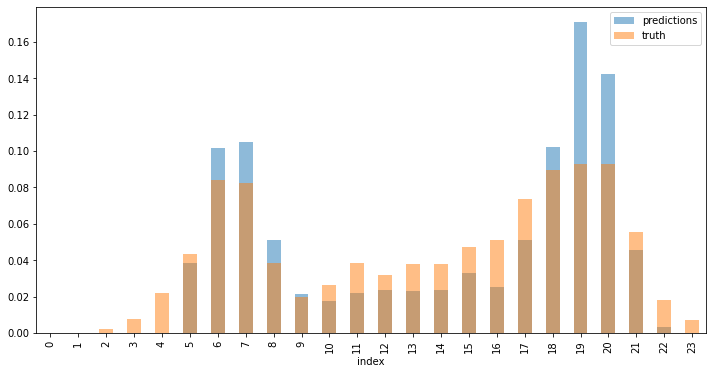

In [58]:
df_subset_pred_h2 = pd.DataFrame(df_subset_h2)
df_subset_pred_h2["activity_pred"] = 1

fig, ax = plt.subplots() 

plot_activity_hist(df_subset_pred_h2['activity_pred'], figsize=(12, 6), alpha=0.5, label='predictions', ax=ax) 
plot_activity_hist(test_df_h2["activity"], figsize=(12, 6), alpha=0.5, label='truth', color='tab:orange', ax=ax)

Score f_beta : 76.820%
Score accuracy : 75.812%


(0.768203583280693, 0.7581157374735357)

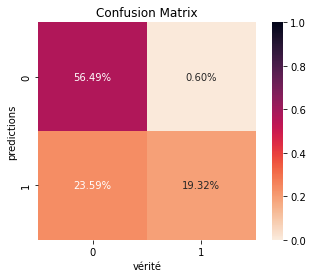

In [59]:
test_df_eval_h2 = test_df_h2.copy()
test_df_eval_h2["activity"] = 0
idx_anom = df_subset_pred_h2.index
test_df_eval_h2.loc[idx_anom, "activity"] = 1
test_df_eval_h2
plot_confusion_matrix(test_df_h2["activity"].values, test_df_eval_h2['activity'].values)

### Fune-tine the model on house 1

Epoch 1/25
4/4 [==============================] - 0s 24ms/step - loss: 0.0242 - val_loss: 0.0086
Epoch 2/25
4/4 [==============================] - 0s 14ms/step - loss: 0.0187 - val_loss: 0.0074
Epoch 3/25
4/4 [==============================] - 0s 15ms/step - loss: 0.0174 - val_loss: 0.0059
Epoch 4/25
4/4 [==============================] - 0s 16ms/step - loss: 0.0168 - val_loss: 0.0063
Epoch 5/25
4/4 [==============================] - 0s 18ms/step - loss: 0.0139 - val_loss: 0.0047
Epoch 6/25
4/4 [==============================] - 0s 14ms/step - loss: 0.0129 - val_loss: 0.0045
Epoch 7/25
4/4 [==============================] - 0s 15ms/step - loss: 0.0130 - val_loss: 0.0039
Epoch 8/25
4/4 [==============================] - 0s 16ms/step - loss: 0.0124 - val_loss: 0.0037
Epoch 9/25
4/4 [==============================] - 0s 18ms/step - loss: 0.0114 - val_loss: 0.0036
Epoch 10/25
4/4 [==============================] - 0s 18ms/step - loss: 0.0113 - val_loss: 0.0035
Epoch 11/25
4/4 [============

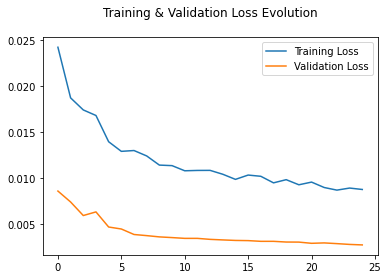

In [60]:
history = model_h2.fit(
    X_train_h1,
    X_train_h1,
    epochs=25,
    batch_size=128,
    validation_split=0.1,
    callbacks=[
        keras.callbacks.EarlyStopping(monitor="val_loss", patience=5, mode="min")
    ],
)

plt.plot(history.history["loss"], label="Training Loss")
plt.plot(history.history["val_loss"], label="Validation Loss")
plt.legend()
plt.title("Training & Validation Loss Evolution\n")
plt.show()

Number of data points considered as anomalies (= activity) :  6320


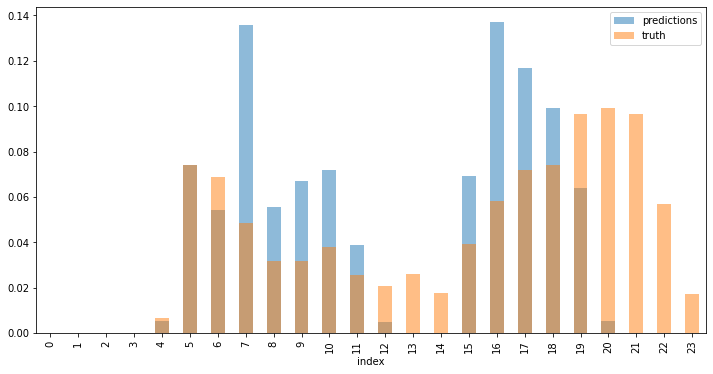

In [61]:
# Get train MAE loss.
X_train_pred_h1 = model_h2.predict(X_train_h1)
train_mae_loss_h1 = np.mean(np.abs(X_train_pred_h1 - X_train_h1), axis=1)

# Get reconstruction loss threshold.
threshold_h1 = np.max(train_mae_loss_h1)

df_test_value_h1 = test_df_h1["mains"]

anomalies = test_mae_loss_h1 > threshold_h1

# get index of each sequence considered as an anomaly
sequences_anomalies_idx = list()
for i in range(len(anomalies)):
    if anomalies[i] == True:
        sequences_anomalies_idx.append(i)

# get index of each data point from X_test considered as an anomaly 
data_anomalies_idx = list()
for elm in sequences_anomalies_idx:
    for i in range(SEQUENCE_LENGTH):
        data_idx = y_test_h1[elm][i][2] 
        data_anomalies_idx.append(data_idx)

print("Number of data points considered as anomalies (= activity) : ", len(data_anomalies_idx))

df_subset_h1 = df_test_value_h1.iloc[data_anomalies_idx]
df_subset_h1 = df_subset_h1[df_subset_h1.values > threshold_h1]
df_subset_pred_h1 = pd.DataFrame(df_subset_h1)
df_subset_pred_h1["activity_pred"] = 1

fig, ax = plt.subplots() 

plot_activity_hist(df_subset_pred_h1['activity_pred'], figsize=(12, 6), alpha=0.5, label='predictions', ax=ax) 
plot_activity_hist(test_df_h1["activity"], figsize=(12, 6), alpha=0.5, label='truth', color='tab:orange', ax=ax)

Score f_beta : 49.636%
Score accuracy : 60.407%


(0.4963603250716955, 0.6040701522170748)

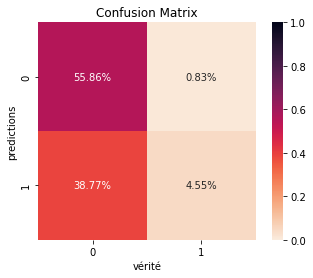

In [62]:
test_df_eval_h1 = test_df_h1.copy()
test_df_eval_h1["activity"] = 0
idx_anom = df_subset_pred_h1.index
test_df_eval_h1.loc[idx_anom, "activity"] = 1
test_df_eval_h1
plot_confusion_matrix(test_df_h1["activity"].values, test_df_eval_h1['activity'].values)

Number of data points considered as anomalies (= activity) :  13640


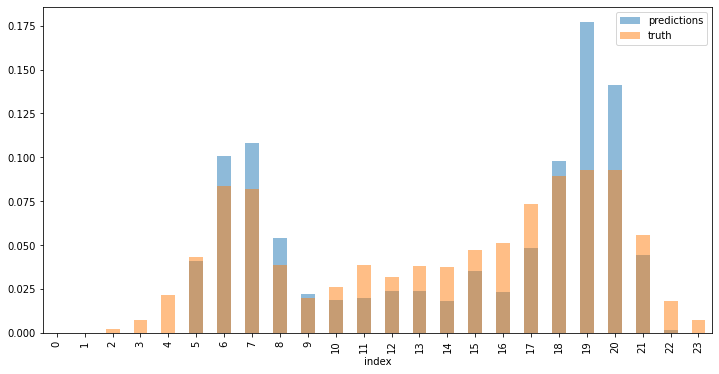

In [63]:
# Get train MAE loss.
X_train_pred_h2 = model_h2.predict(X_train_h2)
train_mae_loss_h2 = np.mean(np.abs(X_train_pred_h2 - X_train_h2), axis=1)

# Get reconstruction loss threshold.
threshold_h2 = np.max(train_mae_loss_h2)

df_test_value_h2 = test_df_h2["mains"]

anomalies = test_mae_loss_h2 > threshold_h2

# get index of each sequence considered as an anomaly
sequences_anomalies_idx = list()
for i in range(len(anomalies)):
    if anomalies[i] == True:
        sequences_anomalies_idx.append(i)

# get index of each data point from X_test considered as an anomaly 
data_anomalies_idx = list()
for elm in sequences_anomalies_idx:
    for i in range(SEQUENCE_LENGTH):
        data_idx = y_test_h2[elm][i][2] 
        data_anomalies_idx.append(data_idx)

print("Number of data points considered as anomalies (= activity) : ", len(data_anomalies_idx))

df_subset_h2 = df_test_value_h2.iloc[data_anomalies_idx]
df_subset_h2 = df_subset_h2[df_subset_h2.values > threshold_h2]
df_subset_pred_h2 = pd.DataFrame(df_subset_h2)
df_subset_pred_h2["activity_pred"] = 1

fig, ax = plt.subplots() 

plot_activity_hist(df_subset_pred_h2['activity_pred'], figsize=(12, 6), alpha=0.5, label='predictions', ax=ax) 
plot_activity_hist(test_df_h2["activity"], figsize=(12, 6), alpha=0.5, label='truth', color='tab:orange', ax=ax)

Score f_beta : 75.599%
Score accuracy : 74.753%


(0.7559862504882946, 0.747529992942837)

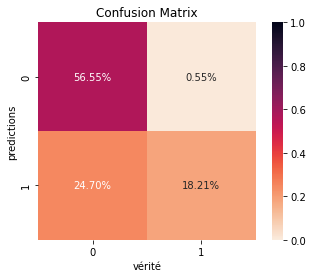

In [64]:
test_df_eval_h2 = test_df_h2.copy()
test_df_eval_h2["activity"] = 0
idx_anom = df_subset_pred_h2.index
test_df_eval_h2.loc[idx_anom, "activity"] = 1
test_df_eval_h2
plot_confusion_matrix(test_df_h2["activity"].values, test_df_eval_h2['activity'].values)